In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras 
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing.image import image_dataset_from_directory
from keras.layers import Conv2D, Dense, MaxPooling2D, Dropout,Flatten
from keras.models import Model
from keras.applications.vgg16 import VGG16
from tensorflow.keras.applications import MobileNetV3Large
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.models import Model

In [2]:
from tensorflow.keras.models import load_model

vgg_gray_model = load_model('vgg_gray_model1.h5')
vgg_color_model = load_model('vgg_color_model.h5')
vgg_segmented_model = load_model('vgg_segmented_model.h5')

inception_gray_model = load_model('Inception_gray_model.h5')
inception_color_model = load_model('Inception_color_model.h5')
inception_segmented_model = load_model('Inception_segmented_model.h5')

In [3]:
train_gen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    shear_range=0.2,
    zoom_range=0.2,
    width_shift_range=0.05,
    height_shift_range=0.05,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2,
)

valid_gen = ImageDataGenerator(
    rescale=1./255,  # Corrected rescale parameter
    validation_split=0.2,
    
)


In [4]:
Image_size = (255, 255)
Batch_size = 32
seed = 106

In [5]:
data_dir_segmented = r"E:\archive (1)\dataset2\plantvillage dataset\segmented"
train_generator_segmented = train_gen.flow_from_directory(
    data_dir_segmented,
    target_size=Image_size,
    batch_size=Batch_size,
    subset="training",
    class_mode="categorical",
    color_mode="rgb",  
    
)

valid_generator_segmented = valid_gen.flow_from_directory(
    data_dir_segmented,
    target_size=Image_size,
    batch_size=Batch_size,
    subset="validation",
    class_mode="categorical",
    color_mode="rgb",
    seed = 106
    
      
)

Found 43456 images belonging to 38 classes.
Found 10849 images belonging to 38 classes.


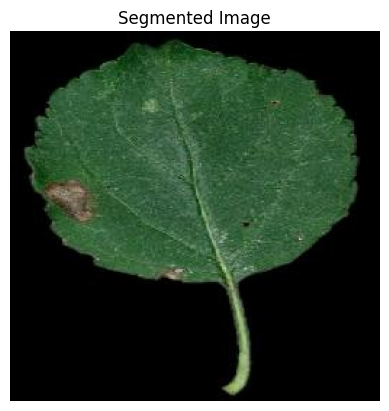

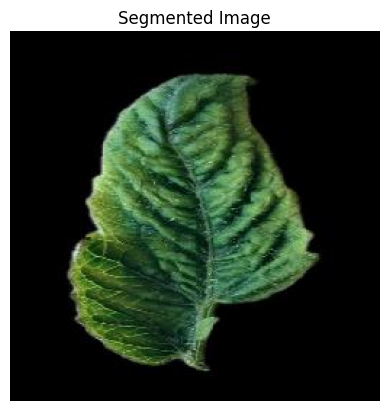

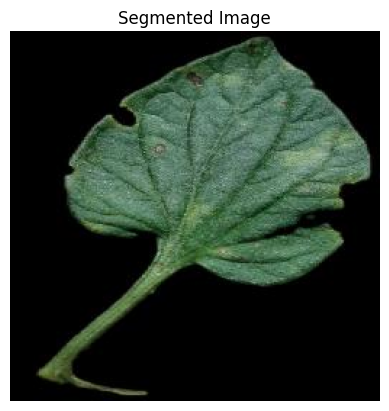

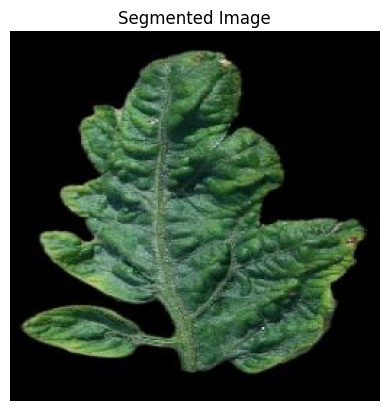

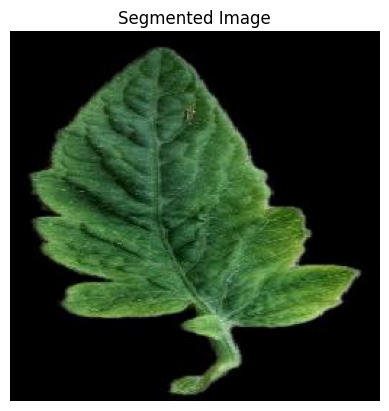

...

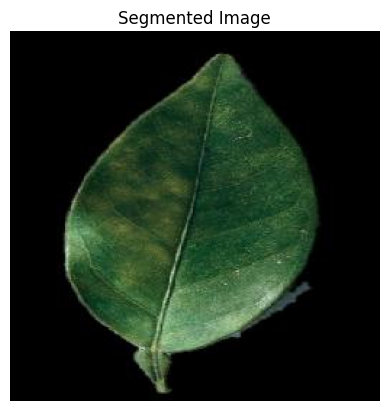

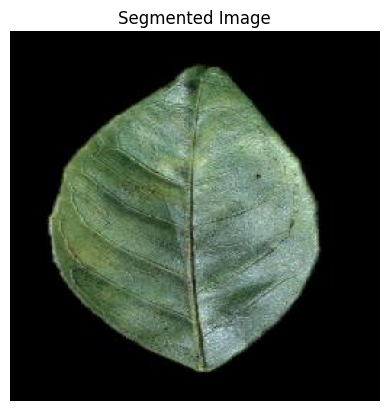

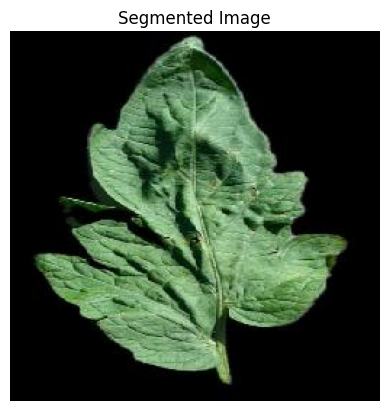

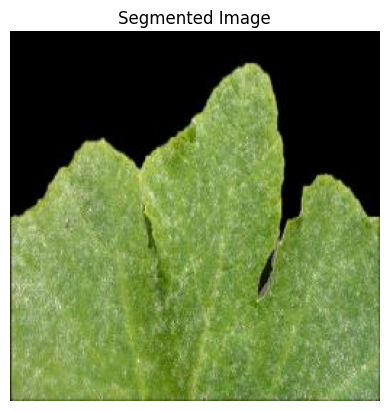

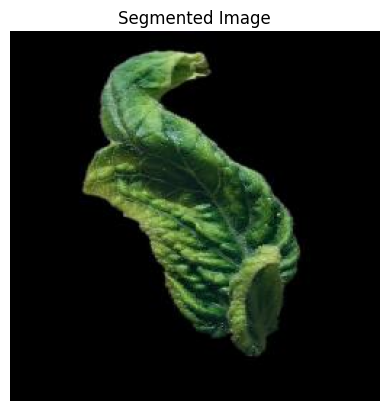

In [6]:
batch_images_segmented, batch_labels_segmented = valid_generator_segmented.next()
import matplotlib.pyplot as plt

for i in range(len(batch_images_segmented)):
    
    img_segmented = batch_images_segmented[i]
    
    
    # Display grayscale image
    plt.imshow(img_segmented)
    plt.title("Segmented Image")
    plt.axis('off')
    plt.show()


In [6]:
import numpy as np
import matplotlib.pyplot as plt

class_names = [
    'Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy',
    'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy',
    'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_',
    'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot',
    'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy',
    'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy',
    'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight',
    'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy',
    'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy',
    'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold',
    'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot',
    'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Tomato_mosaic_virus', 'Tomato___healthy'
]




In [8]:
inception_preds_segmented = inception_segmented_model.predict(batch_images_segmented)
vgg16_preds_segmented = vgg_segmented_model.predict(batch_images_segmented)
ensemble_preds_segmented = (inception_preds_segmented + vgg16_preds_segmented) / 2
ensemble_predicted_classes_segmented = np.argmax(ensemble_preds_segmented, axis=1)

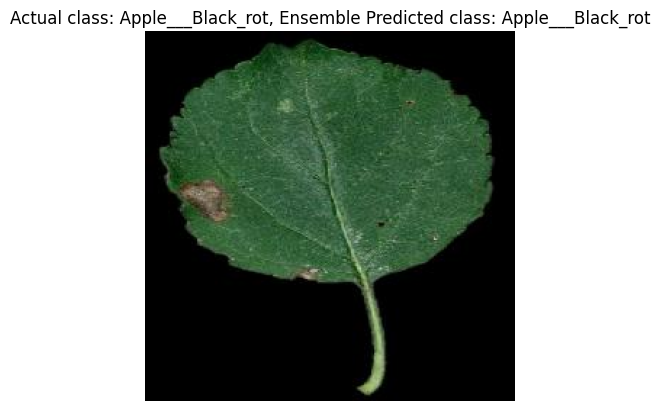

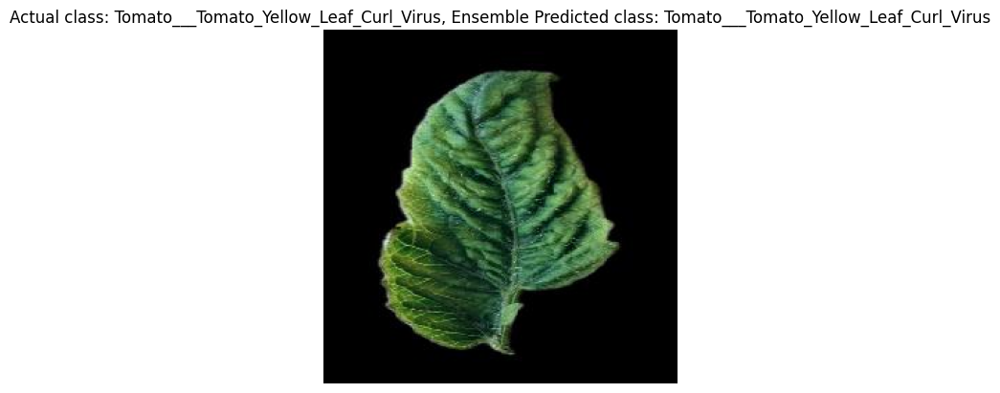

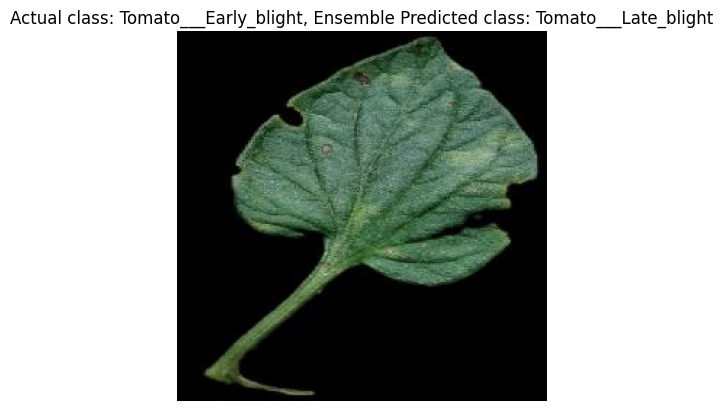

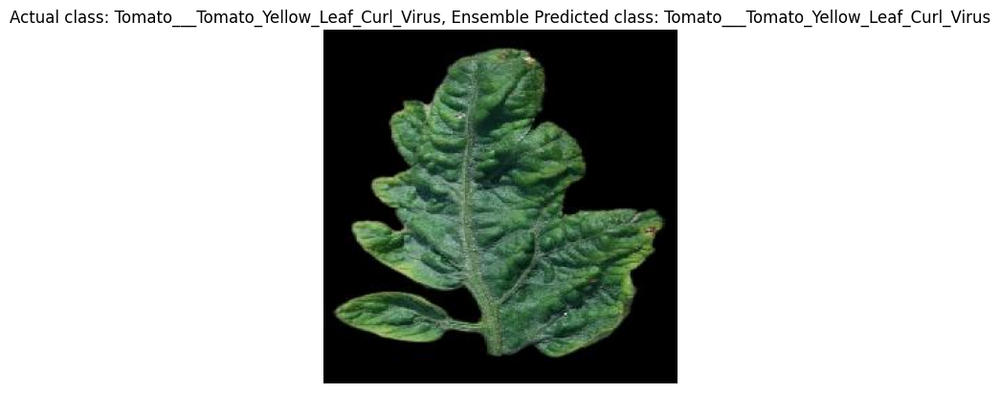

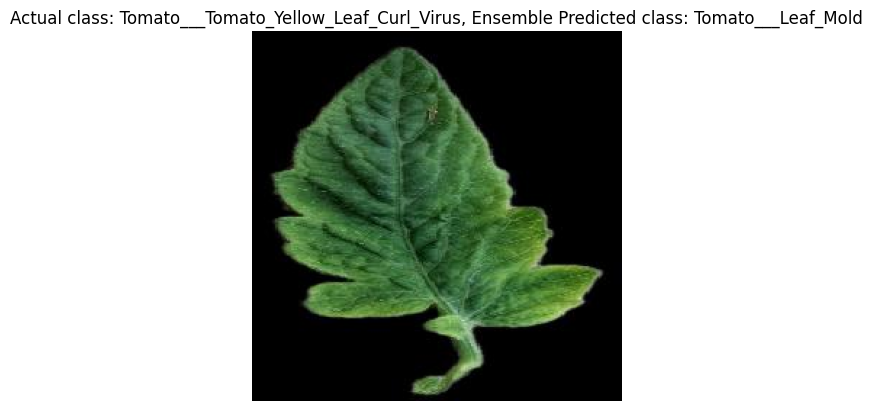

...

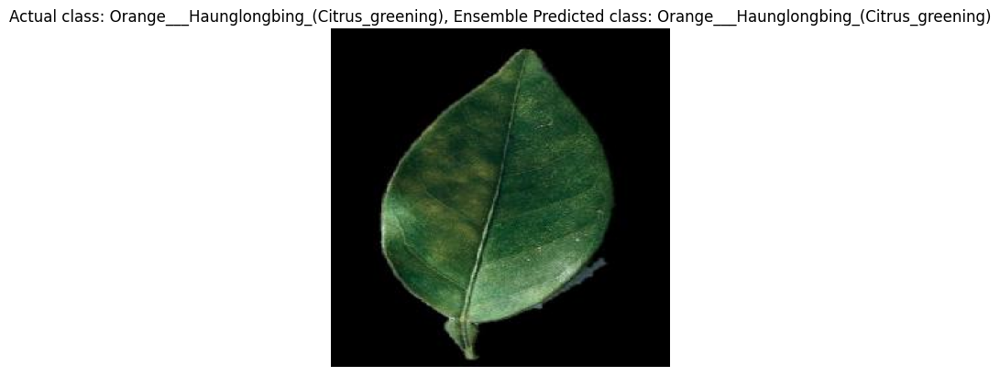

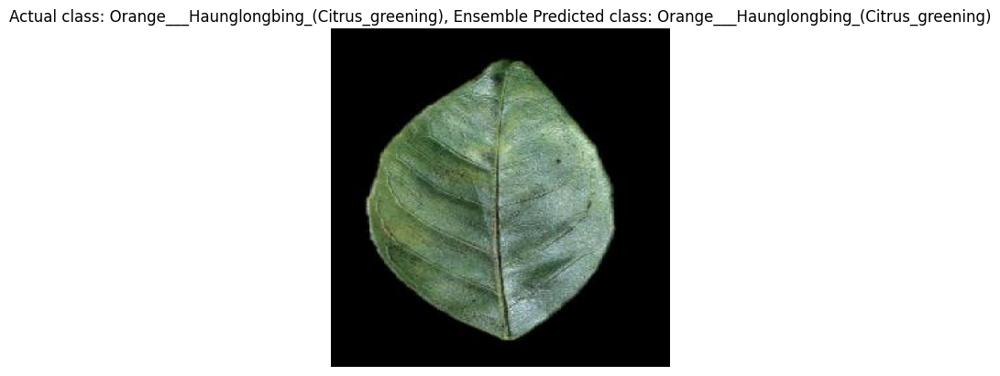

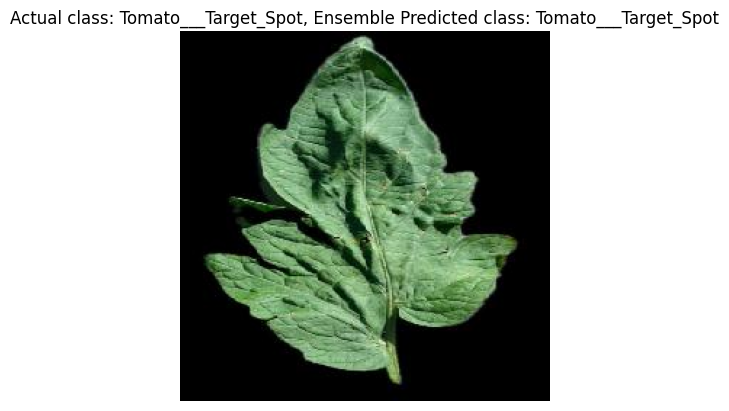

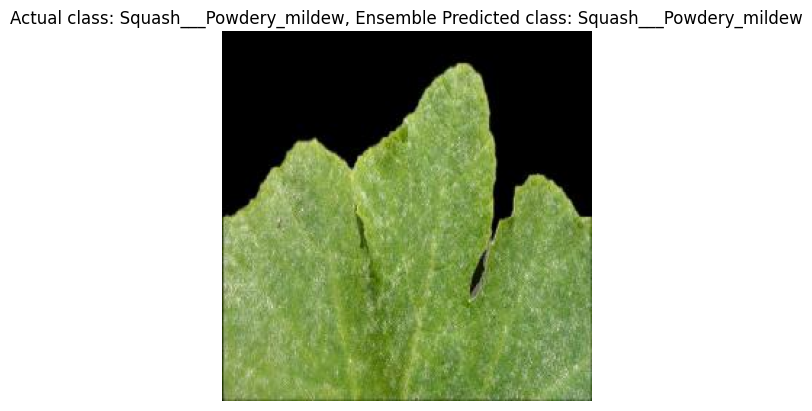

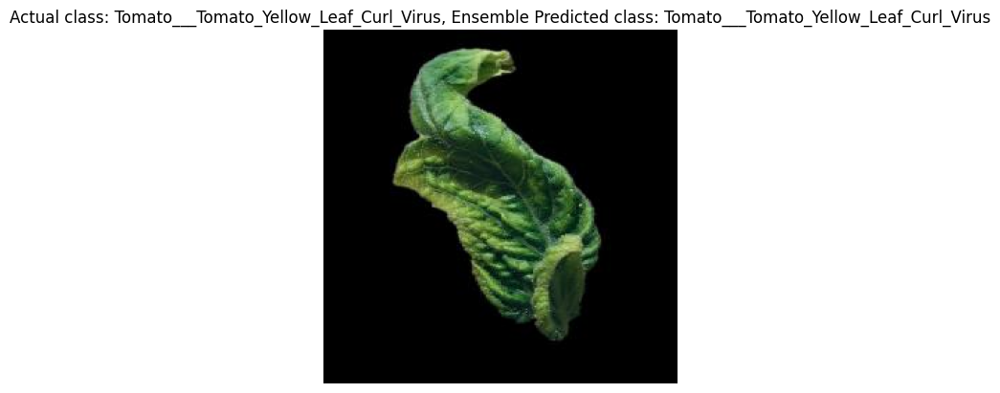

In [11]:
for i in range(len(batch_labels_segmented)):
    # Load and display the image
    img = batch_images_segmented[i]
    plt.imshow(img)
    plt.axis('off')

    # Display the actual and predicted classes for the ensemble
    actual_class = class_names[np.argmax(batch_labels_segmented[i])]
    ensemble_predicted_class = class_names[ensemble_predicted_classes_segmented[i]]
    plt.title(f"Actual class: {actual_class}, Ensemble Predicted class: {ensemble_predicted_class}")
    plt.show()

Inception Model Accuracy: 0.96875
VGG16 Model Accuracy: 0.84375
Ensemble Model Accuracy: 0.9375


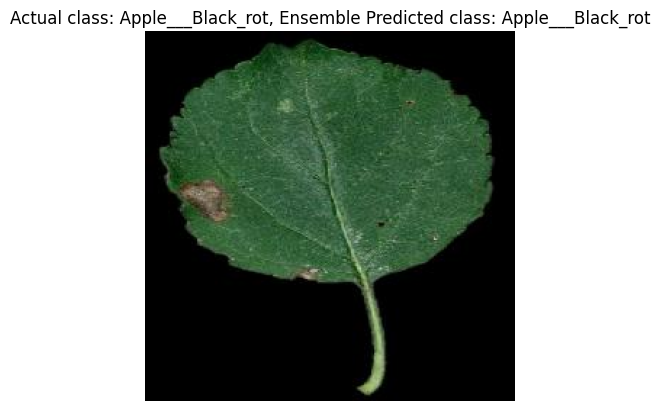

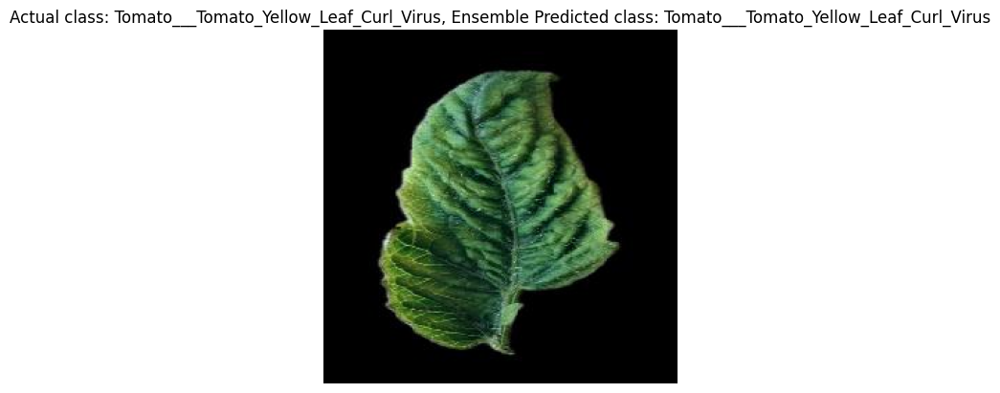

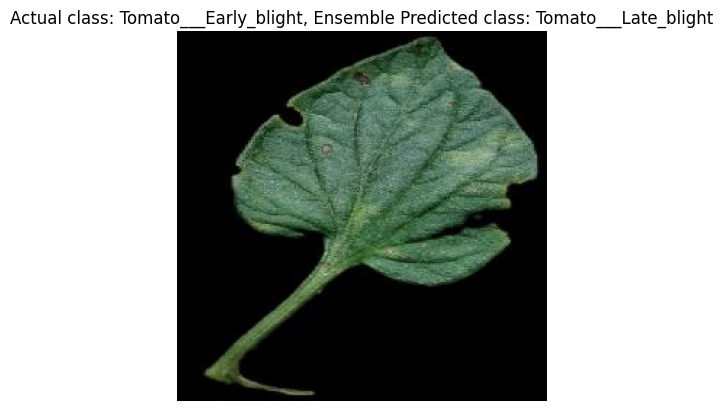

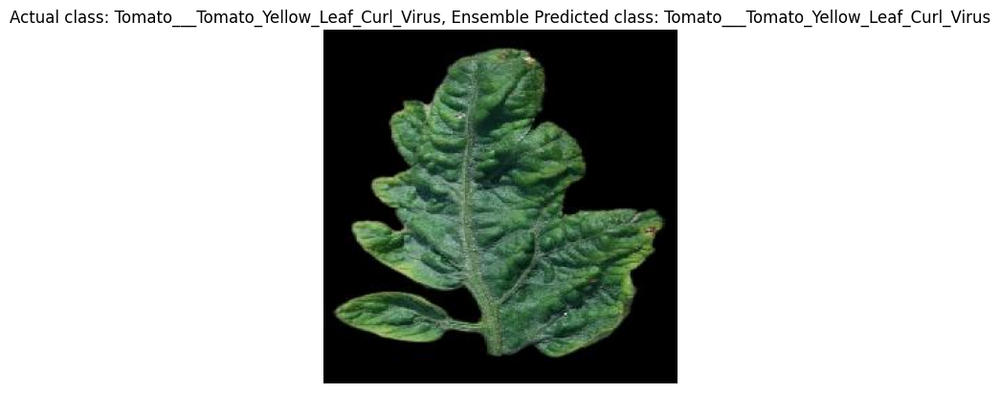

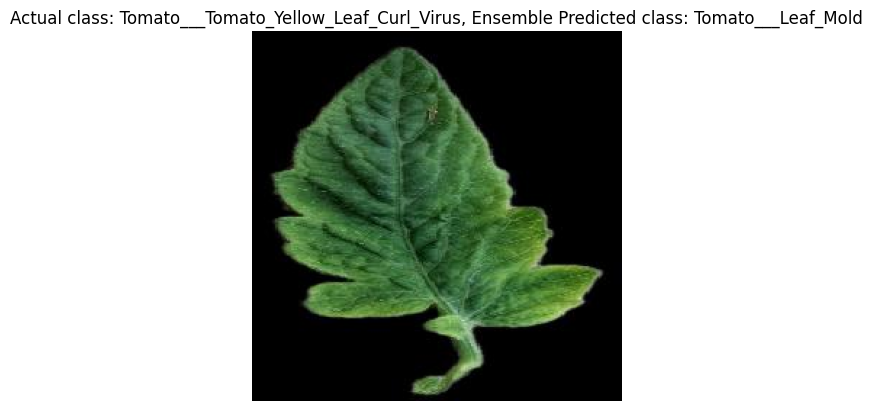

...

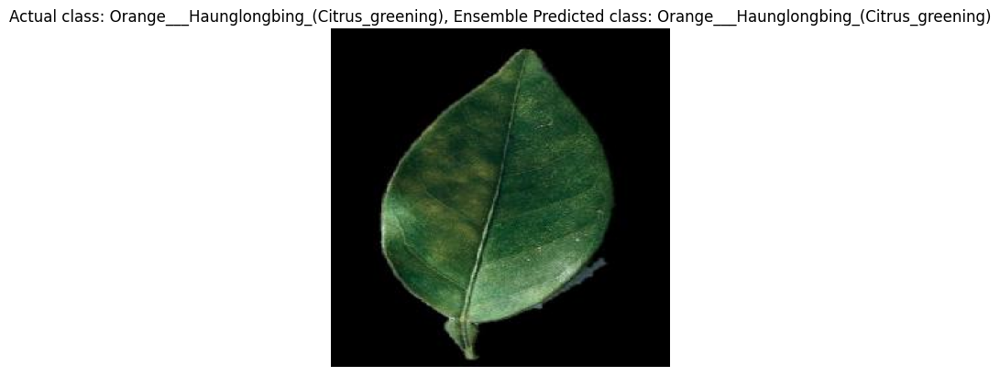

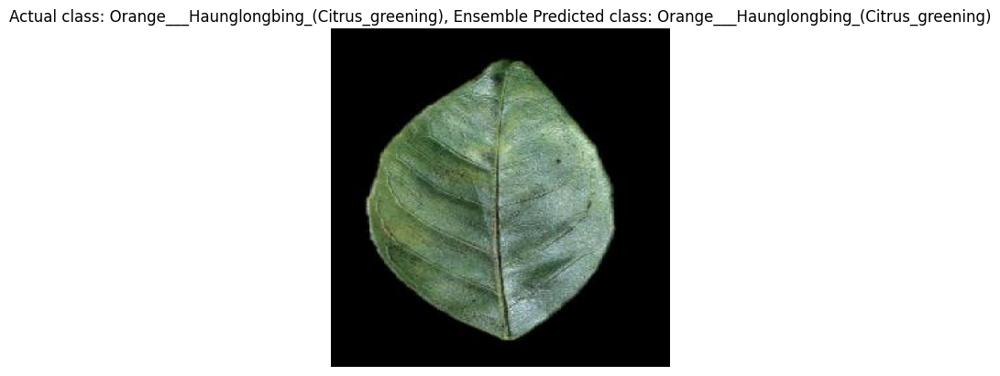

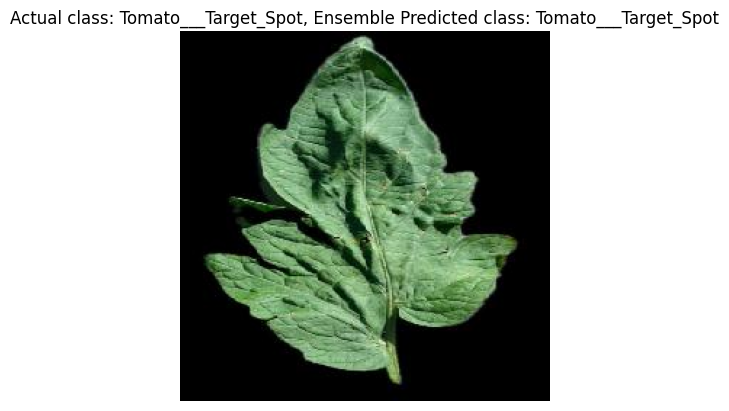

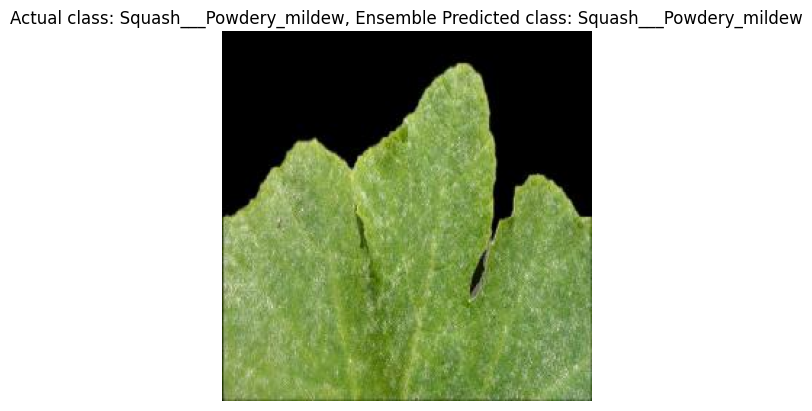

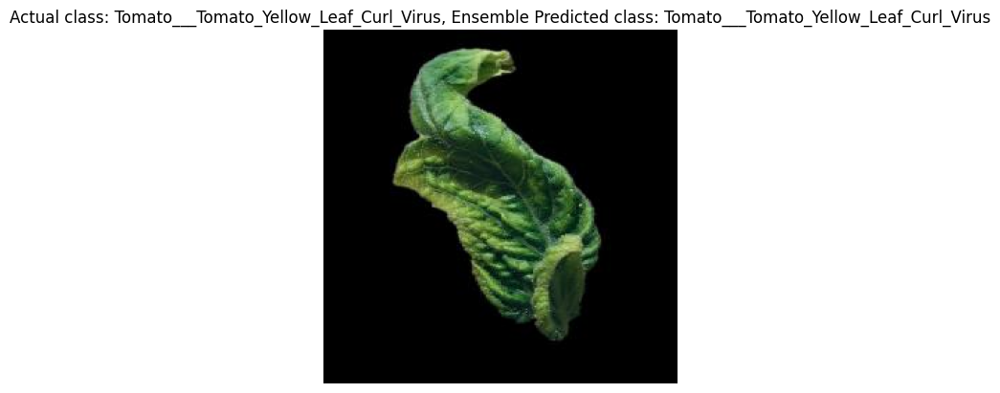

In [12]:
from sklearn.metrics import accuracy_score

# Calculate accuracy of each individual model
inception_accuracy_segmented = accuracy_score(np.argmax(batch_labels_segmented, axis=1), np.argmax(inception_preds_segmented, axis=1))
vgg16_accuracy_segmented = accuracy_score(np.argmax(batch_labels_segmented, axis=1), np.argmax(vgg16_preds_segmented, axis=1))

# Calculate accuracy of the ensemble model
ensemble_accuracy_segmented = accuracy_score(np.argmax(batch_labels_segmented, axis=1), ensemble_predicted_classes_segmented)

print("Inception Model Accuracy:", inception_accuracy_segmented)
print("VGG16 Model Accuracy:", vgg16_accuracy_segmented)
print("Ensemble Model Accuracy:", ensemble_accuracy_segmented)

# Display the images along with their actual and predicted classes for the ensemble
for i in range(len(batch_labels_segmented)):
    # Load and display the image
    img = batch_images_segmented[i]
    plt.imshow(img)
    plt.axis('off')

    # Display the actual and predicted classes for the ensemble
    actual_class = class_names[np.argmax(batch_labels_segmented[i])]
    ensemble_predicted_class = class_names[ensemble_predicted_classes_segmented[i]]
    plt.title(f"Actual class: {actual_class}, Ensemble Predicted class: {ensemble_predicted_class}")
    plt.show()

In [13]:
from sklearn.metrics import accuracy_score
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score

# Initialize lists to store accuracy scores for each model
accuracy_scores_inception = []
accuracy_scores_vgg16 = []
accuracy_scores_ensemble = []

k_folds = 5

# Initialize KFold object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Iterate over folds
for fold_idx, (train_idx, val_idx) in enumerate(kf.split(batch_images_segmented)):
    print(f"Fold {fold_idx + 1}")

    # Split data into training and validation sets for segmented images
    X_train_segmented, X_val_segmented = batch_images_segmented[train_idx], batch_images_segmented[val_idx]
    y_train_segmented, y_val_segmented = batch_labels_segmented[train_idx], batch_labels_segmented[val_idx]

    # Make predictions on segmented images using Inception and VGG16 models
    inception_preds_segmented = inception_segmented_model.predict(X_val_segmented)
    vgg_preds_segmented = vgg_segmented_model.predict(X_val_segmented)

    # Combine predictions of individual models using ensemble fusion for segmented images
    ensemble_preds_segmented = (inception_preds_segmented + vgg_preds_segmented) / 2
    ensemble_predicted_classes_segmented = np.argmax(ensemble_preds_segmented, axis=1)

    # Calculate accuracy for each model
    accuracy_inception = accuracy_score(np.argmax(y_val_segmented, axis=1), np.argmax(inception_preds_segmented, axis=1))
    accuracy_vgg16 = accuracy_score(np.argmax(y_val_segmented, axis=1), np.argmax(vgg_preds_segmented, axis=1))
    accuracy_ensemble = accuracy_score(np.argmax(y_val_segmented, axis=1), ensemble_predicted_classes_segmented)

    # Append accuracy scores to respective lists
    accuracy_scores_inception.append(accuracy_inception)
    accuracy_scores_vgg16.append(accuracy_vgg16)
    accuracy_scores_ensemble.append(accuracy_ensemble)

    # Print fold accuracies
    print("Inception Model Accuracy (Segmented):", accuracy_inception)
    print("VGG16 Model Accuracy (Segmented):", accuracy_vgg16)
    print("Ensemble Model Accuracy (Segmented):", accuracy_ensemble)

# Calculate average accuracies across all folds for each model
avg_accuracy_inception = np.mean(accuracy_scores_inception)
avg_accuracy_vgg16 = np.mean(accuracy_scores_vgg16)
avg_accuracy_ensemble = np.mean(accuracy_scores_ensemble)

# Print average accuracies for each model
print("\nAverage Inception Model Accuracy (Segmented) Across All Folds:", avg_accuracy_inception)
print("Average VGG16 Model Accuracy (Segmented) Across All Folds:", avg_accuracy_vgg16)
print("Average Ensemble Model Accuracy (Segmented) Across All Folds:", avg_accuracy_ensemble)


Fold 1
Inception Model Accuracy (Segmented): 1.0
VGG16 Model Accuracy (Segmented): 1.0
Ensemble Model Accuracy (Segmented): 1.0
Fold 2
Inception Model Accuracy (Segmented): 1.0
VGG16 Model Accuracy (Segmented): 0.7142857142857143
Ensemble Model Accuracy (Segmented): 0.8571428571428571
Fold 3
Inception Model Accuracy (Segmented): 0.8333333333333334
VGG16 Model Accuracy (Segmented): 0.6666666666666666
Ensemble Model Accuracy (Segmented): 0.8333333333333334
Fold 4
Inception Model Accuracy (Segmented): 1.0
VGG16 Model Accuracy (Segmented): 0.8333333333333334
Ensemble Model Accuracy (Segmented): 1.0
Fold 5
Inception Model Accuracy (Segmented): 1.0
VGG16 Model Accuracy (Segmented): 1.0
Ensemble Model Accuracy (Segmented): 1.0

Average Inception Model Accuracy (Segmented) Across All Folds: 0.9666666666666668
Average VGG16 Model Accuracy (Segmented) Across All Folds: 0.8428571428571429
Average Ensemble Model Accuracy (Segmented) Across All Folds: 0.9380952380952381


In [7]:
from sklearn.metrics import accuracy_score

# Initialize lists to store predictions and actual labels
all_segmented_predictions = []
all_actual_labels = []

# Iterate over all batches in the validation generator
for i in range(valid_generator_segmented.samples // Batch_size + 1):
    # Generate a batch of segmented images and labels
    batch_images_segmented, batch_labels_segmented = valid_generator_segmented.next()

    # Make predictions using the segmented ensembled model for each batch
    inception_preds_segmented = inception_segmented_model.predict(batch_images_segmented)
    vgg16_preds_segmented = vgg_segmented_model.predict(batch_images_segmented)
    ensemble_preds_segmented = (inception_preds_segmented + vgg16_preds_segmented) / 2
    ensemble_predicted_classes_segmented = np.argmax(ensemble_preds_segmented, axis=1)

    # Concatenate the segmented predictions and actual labels from each batch
    all_segmented_predictions.extend(ensemble_predicted_classes_segmented)
    all_actual_labels.extend(batch_labels_segmented)  # Assuming labels are the same for all batches (you may need to adjust this)

# Convert the lists to numpy arrays
all_segmented_predictions = np.array(all_segmented_predictions)
all_actual_labels = np.array(all_actual_labels)

# Get the actual class labels as indices
actual_labels_indices = np.argmax(all_actual_labels, axis=1)

# Calculate the accuracy of the segmented ensembled model predictions for the entire validation dataset
accuracy_segmented = accuracy_score(actual_labels_indices, all_segmented_predictions)

# Print the overall accuracy for the segmented ensembled model on the entire validation dataset
print("Overall Accuracy of Segmented Ensembled Model on Validation Dataset:", accuracy_segmented)


Overall Accuracy of Segmented Ensembled Model on Validation Dataset: 0.9438657940824039
